In [58]:
import sys
import os

current_dir = os.path.dirname(os.path.abspath('__file__'))

project_root = os.path.abspath(os.path.join(current_dir, '..'))

if project_root not in sys.path:
    sys.path.insert(0, project_root)

from utils.utils import load_image, apply, display_image, display_image_comparison, rgb_to_grayscale, generate_histogram, display_image_comparison_with_histogram, equalize_histogram, match_histogram

# Chapter 5: Basic Edge Detection

An **edge** is a region in an image where the intensity levels move from an area of low values to an area of high values or vice versa. Detcting edges in an image is a fundemental operation in image processing. The edges in an image provide information about where items are, their size, shape, and something about their texture. An edge detcted image contains bright values where edges are present and dark values where they aren't.

The process of detecting the edges of an image is sometimes called *image diffrentiation*. Since an edge indicates a change in intensity, a detected edge is essentially the derivative of the edge. Since we represent images as matrices containing discrete pixel values, we have to perform a *discrete diffrentiation*. We want this discrete diffrentiation to operate on pixel intensities in all directions to detect edges in any orientation. We can approximate this discrete diffrentiation through the use of convolution (*more accurately discrete convolution*).

## Discrete Convolution for Images

Convolution involves sliding a kernel (a small matrix) over the image and computing the sum of the product of the kernel values with the corresponding pixel values in the image. 

Consider an image $\mathbf{I}$ of size $M \times N$ and a kernel $\mathbf{K}$ of size $H \times W$, the convolution of the two matrices $(\mathbf{I} * \mathbf{K})$ at position $[x,y]$ is calculated as:
$$
    (\mathbf{I} * \mathbf{K})[x,y] = \sum_{j=0}^{H-1} \sum_{i=0}^{W-1} \mathbf{I}[x + i, y + j] \cdot K[i,j].
$$

### Stride

**Stride** refers to the number of pixels the kernel moves (or "strides") over the image during the convolution process. A stride of 1 means the kernel moves one pixel at a time, while a stride of 2 means it moves two pixels at a time, effectively skipping every other pixel:
$$
    (\mathbf{I} * \mathbf{K})[x,y] = \sum_{j=0}^{H-1} \sum_{i=0}^{W-1} \mathbf{I}[x \cdot S + i, y \cdot S + j] \cdot K[i,j],
$$
where $S$ represents stride value.

Stride affects the spatial dimensions of the output image:
$$
M_{\text{out}} = \left\lfloor \frac{M - H}{S} \right\rfloor + 1,
$$

$$
N_{\text{out}} = \left\lfloor \frac{N - W}{S} \right\rfloor + 1.
$$

### Padding 

**Padding** involves adding extra pixels around the border of the input image. This is typically done to control the spatial dimensions of the output image or to allow the kernel to fully cover the edges of the image

**Types of Padding:**

1. **Valid Padding:** No padding is applied. The kernel only slides within the bounds of the image.
2. **Same Padding:** Padding is applied so that the output dimensions are the same as the input dimensions when the stride is 1.

We typically use *Zero-Padding* which means we pad the input image $\mathbf{I}$ with zeros. 

Padding affects the spatial dimesnions of the output image:
$$
M_{\text{out}} = \left\lfloor \frac{M + 2P - H}{S} \right\rfloor + 1,
$$

$$
N_{\text{out}} = \left\lfloor \frac{N + 2P - W}{S} \right\rfloor + 1.
$$

### Implementation

In [2]:
import numpy as np

In [3]:
def convolve(I: np.ndarray, K: np.ndarray, S: int = 1, padding=True) -> np.ndarray:
    M, N = I.shape
    H, W = K.shape

    if padding:
        P_y = H // 2
        P_x = W // 2

        I_padded = np.pad(I, ((P_y, P_y), (P_x, P_x)), mode='constant', constant_values=0)
    else:
        I_padded = I
        P_y = 0
        P_x = 0

    M_padded, N_padded = I_padded.shape

    M_out = (M_padded - H) // S + 1
    N_out = (N_padded - W) // S + 1

    output = np.zeros((M_out, N_out))
    
    for x in range(M_out):
        for y in range(N_out):
            region = I_padded[x * S : x * S + H, y * S : y * S + W]
            output[x, y] = np.sum(region * K)

    return output

A faster implementation of 2-D convolution is available in the SciPy libirary.

In [4]:
from scipy.signal import convolve2d

/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


### Examples

#### Example 1

For this example we convolve with a simple kernel:

$$
K = \begin{bmatrix}
-1 & 0 & -1 \\
0 & 4 & 0 \\
-1 & 0 & -1
\end{bmatrix}
$$

In [5]:
K = np.array([
    [-1,  0, -1],
    [ 0,  4,  0],
    [-1,  0, -1]
])

In [6]:
image_1_path = "../TEST-IMAGES/ADDITIONAL/flowers.ppm"
image_1 = load_image(image_1_path)

Image Metadata for 'flowers.ppm':
 - Format: PPM
 - Size on Disk: 530.31 KB
 - Dimensions: 500x362 pixels
 - Mode: RGB
 - Channels: 3


Since the image is in RGB, we'll first have to convert it to grayscale.

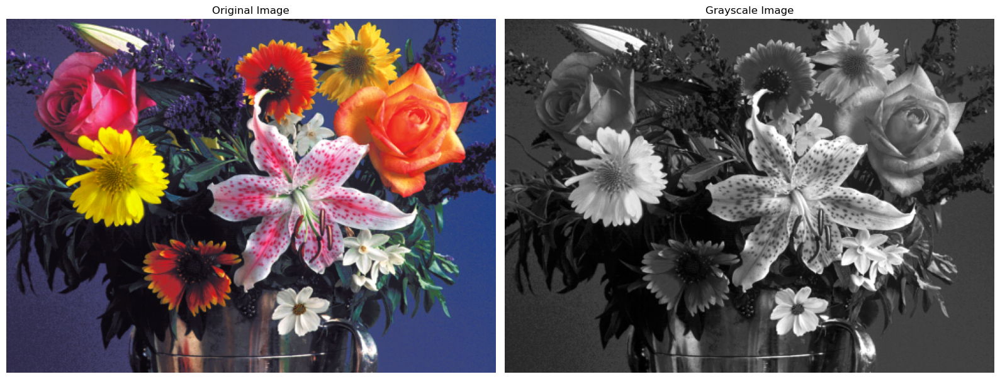

In [7]:
grayscale_image_1 = apply(image_1, rgb_to_grayscale)
display_image_comparison(image_1, grayscale_image_1, 'Original Image', 'Grayscale Image')

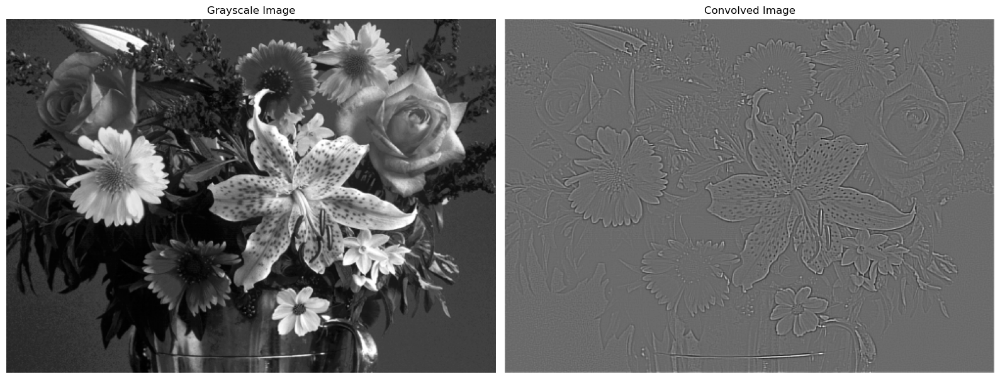

In [8]:
convolved_grayscale_image_1 = apply(grayscale_image_1, convolve, K=K)
display_image_comparison(grayscale_image_1, convolved_grayscale_image_1, 'Grayscale Image', 'Convolved Image')

We can use this example to compare between the performance of our implementation vs. SciPy's implementation for convolution.

In [9]:
%timeit apply(grayscale_image_1, convolve, K=K)

989 ms ± 32.3 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [10]:
%timeit apply(grayscale_image_1, convolve2d, in2=K)

8.46 ms ± 327 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


The SciPy implementation is $\approx$ 100 times faster than our implementation.

## Edge Detection Kernels/Masks

Several masks have been developed for edge detections each with their own advantages and disatvantages. The choice of the masks to be used in the process of edge detection affects resulting edge detected images, and the amount of processing needed for edge detection.

### Gradient-Based Masks

#### Quick Mask

The **Quick Mask** is one of the simplest edge detection masks. It is computationally efficient, however due to it's simplicity it may be less accurate in detecting edges compared to more sophisticated masks.

**Horizontal Mask:**

$$
K_{Quick}^{H} = \begin{bmatrix}
-1 & 0 & 1
\end{bmatrix}
$$

**Vertical Mask:**

$$
K_{Quick}^{V} = \begin{bmatrix}
-1 \\
0 \\
1
\end{bmatrix}
$$


We'll have to define this kernel with some padded zeros since SciPy's implementation requires kernels to also be 2-dimensional

In [44]:
K_quick_H = np.array([
    [ 0, 0, 0],
    [-1, 0, 1],
    [ 0, 0, 0]
])

K_quick_V = np.array([
    [0, -1, 0],
    [0,  0, 0],
    [0,  1, 0]
])

K_quick = [K_quick_H, K_quick_V]

#### Roberts

The **Roberts** operator is a simple, quick to compute, 2-D spatial gradient measurement on an image. It emphasizes regions of high spatial gradient which often correspond to edges. However, it is more sensitive to noise due to its small mask size.

**Roberts Masks:**

$$
K_{Roberts}^{1} = \begin{bmatrix}
1 & 0 \\
0 & -1
\end{bmatrix}
\quad
K_{Roberts}^{2} = \begin{bmatrix}
0 & 1 \\
-1 & 0
\end{bmatrix}
$$


In [12]:
K_roberts1 = np.array([[1,  0],
                       [0, -1]])

K_roberts2 = np.array([[ 0, 1],
                       [-1, 0]])

K_roberts = [K_roberts1, K_roberts2]

#### Sobel

The **Sobel** operator is widely used for edge detection. It uses two 3×3 kernels which are convolved with the original image to calculate approximations of the derivatives – one for horizontal changes and one for vertical. It provides smoothing, which makes it less sensitive to noise compared to the Roberts operator.

**Sobel Masks:**

**Horizontal Mask:**

$$
K_{Sobel}^{H} = \begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

**Vertical Mask:**

$$
K_{Sobel}^{V} = \begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$


In [13]:
K_sobel_H = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
])

K_sobel_V = np.array([
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]
])

K_sobel = [K_sobel_H, K_sobel_V]

#### Prewitt

The **Prewitt** operator is another widely used method for edge detection in image processing. Similar to the Sobel operator, it uses two 3×3 kernels that are convolved with the original image to estimate the gradients in the horizontal and vertical directions. The Prewitt operator emphasizes vertical and horizontal edges and provides a simple way to detect edges with a basic level of noise reduction.

**Prewitt Masks:**

**Horizontal Mask:**

$$
K_{Prewitt}^{H} = \begin{bmatrix}
-1 & 0 & 1 \\
-1 & 0 & 1 \\
-1 & 0 & 1
\end{bmatrix}
$$

**Vertical Mask:**

$$
K_{Prewitt}^{V} = \begin{bmatrix}
-1 & -1 & -1 \\
0 & 0 & 0 \\
1 & 1 & 1
\end{bmatrix}
$$

In [14]:
K_prewitt_H = np.array([
    [-1, 0, 1],
    [-1, 0, 1],
    [-1, 0, 1]
])

K_prewitt_V = np.array([
    [-1, -1, -1],
    [ 0,  0,  0],
    [ 1,  1,  1]
])

K_prewitt = [K_prewitt_H, K_prewitt_V]

### Compass-Based Masks

#### Kirsch Compass

The **Kirsch Compass** operator uses eight different convolution masks to detect edges in all eight compass directions (N, NE, E, SE, S, SW, W, NW). It is effective in detecting edges regardless of their orientation but requires more computational resources due to the multiple masks.

**Kirsch Masks:**

**North (N):**

$$
K_{Kirsch}^{N} = \begin{bmatrix}
5 & 5 & 5 \\
-3 & 0 & -3 \\
-3 & -3 & -3
\end{bmatrix}
$$

**North-East (NE):**

$$
K_{Kirsch}^{NE} = \begin{bmatrix}
5 & 5 & -3 \\
5 & 0 & -3 \\
-3 & -3 & -3
\end{bmatrix}
$$

**East (E):**

$$
K_{Kirsch}^{E} = \begin{bmatrix}
5 & -3 & -3 \\
5 & 0 & -3 \\
5 & -3 & -3
\end{bmatrix}
$$

**South-East (SE):**

$$
K_{Kirsch}^{SE} = \begin{bmatrix}
-3 & -3 & -3 \\
5 & 0 & -3 \\
5 & 5 & -3
\end{bmatrix}
$$

**South (S):**

$$
K_{Kirsch}^{S} = \begin{bmatrix}
-3 & -3 & -3 \\
-3 & 0 & -3 \\
5 & 5 & 5
\end{bmatrix}
$$

**South-West (SW):**

$$
K_{Kirsch}^{SW} = \begin{bmatrix}
-3 & -3 & -3 \\
-3 & 0 & 5 \\
-3 & 5 & 5
\end{bmatrix}
$$

**West (W):**

$$
K_{Kirsch}^{W} = \begin{bmatrix}
-3 & 5 & 5 \\
-3 & 0 & 5 \\
-3 & 5 & 5
\end{bmatrix}
$$

**North-West (NW):**

$$
K_{Kirsch}^{NW} = \begin{bmatrix}
5 & 5 & -3 \\
5 & 0 & -3 \\
-3 & -3 & -3
\end{bmatrix}
$$


In [15]:
K_kirsch_N = np.array([
    [5, 5, 5],
    [-3, 0, -3],
    [-3, -3, -3]
])

K_kirsch_NE = np.array([
    [5, 5, -3],
    [5, 0, -3],
    [-3, -3, -3]
])

K_kirsch_E = np.array([
    [5, -3, -3],
    [5, 0, -3],
    [5, -3, -3]
])

K_kirsch_SE = np.array([
    [-3, -3, -3],
    [5, 0, -3],
    [5, 5, -3]
])

K_kirsch_S = np.array([
    [-3, -3, -3],
    [-3, 0, -3],
    [5, 5, 5]
])

K_kirsch_SW = np.array([
    [-3, -3, -3],
    [-3, 0, 5],
    [-3, 5, 5]
])

K_kirsch_W = np.array([
    [-3, 5, 5],
    [-3, 0, 5],
    [-3, 5, 5]
])

K_kirsch_NW = np.array([
    [5, 5, -3],
    [5, 0, -3],
    [-3, -3, -3]
])

K_kirsch = [
    K_kirsch_N,
    K_kirsch_NE,
    K_kirsch_E,
    K_kirsch_SE,
    K_kirsch_S,
    K_kirsch_SW,
    K_kirsch_W,
    K_kirsch_NW
]

#### Robinson Compass

The **Robinson Compass** operator is similar to the Kirsch operator but uses a different set of masks that are designed to respond to edges in eight principal compass directions. It is less computationally intensive than Kirsch while still providing robust edge detection across multiple orientations.

**Robinson Masks:**

**North (N):**

$$
K_{Robinson}^{N} = \begin{bmatrix}
1 & 2 & 1 \\
0 & 0 & 0 \\
-1 & -2 & -1
\end{bmatrix}
$$

**North-East (NE):**

$$
K_{Robinson}^{NE} = \begin{bmatrix}
2 & 1 & 0 \\
1 & 0 & -1 \\
0 & -1 & -2
\end{bmatrix}
$$

**East (E):**

$$
K_{Robinson}^{E} = \begin{bmatrix}
1 & 0 & -1 \\
2 & 0 & -2 \\
1 & 0 & -1
\end{bmatrix}
$$

**South-East (SE):**

$$
K_{Robinson}^{SE} = \begin{bmatrix}
0 & -1 & -2 \\
1 & 0 & -1 \\
2 & 1 & 0
\end{bmatrix}
$$

**South (S):**

$$
K_{Robinson}^{S} = \begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$

**South-West (SW):**

$$
K_{Robinson}^{SW} = \begin{bmatrix}
-2 & -1 & 0 \\
-1 & 0 & 1 \\
0 & 1 & 2
\end{bmatrix}
$$

**West (W):**

$$
K_{Robinson}^{W} = \begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

**North-West (NW):**

$$
K_{Robinson}^{NW} = \begin{bmatrix}
0 & 1 & 2 \\
-1 & 0 & 1 \\
-2 & -1 & 0
\end{bmatrix}
$$

In [16]:
K_robinson_N = np.array([
    [1,  2,  1],
    [0,  0,  0],
    [-1, -2, -1]
])

K_robinson_NE = np.array([
    [2,  1,  0],
    [1,  0, -1],
    [0, -1, -2]
])

K_robinson_E = np.array([
    [1,  0, -1],
    [2,  0, -2],
    [1,  0, -1]
])

K_robinson_SE = np.array([
    [0, -1, -2],
    [1,  0, -1],
    [2,  1,  0]
])

K_robinson_S = np.array([
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]
])

K_robinson_SW = np.array([
    [-2, -1,  0],
    [-1,  0,  1],
    [ 0,  1,  2]
])

K_robinson_W = np.array([
    [-1,  0,  1],
    [-2,  0,  2],
    [-1,  0,  1]
])

K_robinson_NW = np.array([
    [0,  1,  2],
    [-1, 0,  1],
    [-2, -1, 0]
])

# List of robinson Masks
K_robinson = [
    K_robinson_N,
    K_robinson_NE,
    K_robinson_E,
    K_robinson_SE,
    K_robinson_S,
    K_robinson_SW,
    K_robinson_W,
    K_robinson_NW
]

## Edge Detection Algorithm

### Gradient-Based Algorithm

Let:
-  $\mathbf{I}$: Input image
-  $\mathbf{K} = \{\mathbf{K}_1, \mathbf{K}_2\}$: Convolution kernels (usually in the order 'horizontal', 'vertical')
-  $T$: Threshold value for edge detection

For an image $\mathbf{I}$ of size $M \times N$:

1. For each pixel $[x,y] \in \mathbf{I}$ 
    1. Compute gradients $\mathbf{G}_i$ by convoluting each kernel $\mathbf{K}_i$ with the image $\mathbf{I}$:
       $$
           \mathbf{G}_1[x, y] = (\mathbf{I} * \mathbf{K}_1)[x, y] 
       $$
       $$
           \mathbf{G}_2[x, y] = (\mathbf{I} * \mathbf{K}_2)[x, y]
       $$
    2. Compute gradient magnitude $\mathbf{G}$ and direction $\theta$:
       $$
           \mathbf{G}[x, y] = \sqrt{\mathbf{G}_1[x, y]^2 + \mathbf{G}_2[x, y]^2}
       $$
       $$
           \theta[x, y] = \arctan\left(\frac{\mathbf{G}_2[x, y]}{\mathbf{G}_1[x, y]}\right)
       $$
    3. Apply thresholding to gradient magnitude $\mathbf{G}$:
       $$
           \mathbf{I}_{\text{edges}}[x, y] = 
           \begin{cases}
           1, & \text{if } \mathbf{G}[x, y] \geq T \\
           0, & \text{otherwise}
           \end{cases}       
       $$
       

#### Implementation

In [17]:
from typing import List

In [50]:
def gradient_edge_detect(I: np.ndarray, K: List[np.ndarray], T: int = None) -> np.ndarray:
    M, N = I.shape
    I_edges = np.zeros((M, N), dtype=np.uint8)

    K_1, K_2 = K

    G_1 = convolve2d(I, K_1, mode='same')
    G_2 = convolve2d(I, K_2, mode='same')

    G = np.sqrt(G_1 ** 2 + G_2 ** 2)
    
    if T is not None:
        I_edges[G >= T] = 255
        I_edges[G < T] = 0
    else:
        I_edges = G

    return I_edges

### Compass-Based Algorithm

Let:
- $\mathbf{I}$: Input image
- $\mathbf{K} = \{\mathbf{K}_1, \mathbf{K}_2, \dots, \mathbf{K}_8\}$: Set of convolution kernels for compass directions (e.g., North, Northeast, East, Southeast, South, Southwest, West, Northwest)
- $T$: Threshold value for edge detection

For an image $\mathbf{I}$ of size $M \times N$:

1. For each pixel $[x,y] \in \mathbf{I}$ 
    1. Compute responses $\mathbf{G}_d$ by convolving each kernel $\mathbf{K}_d$ with the image $\mathbf{I}$:
       $$
           \mathbf{G}_1[x, y] = (\mathbf{I} * \mathbf{K}_1)[x, y] 
       $$
       $$
           \mathbf{G}_2[x, y] = (\mathbf{I} * \mathbf{K}_2)[x, y]
       $$
       $$
           \vdots
       $$
       $$
           \mathbf{G}_8[x, y] = (\mathbf{I} * \mathbf{K}_8)[x, y]
       $$
    2. Compute edge strength $\mathbf{G}$:
       $$
           \mathbf{G}[x, y] = \max_{d \in \{1, \dots, 8\}} \left| \mathbf{G}_d[x, y] \right|
       $$
    3. Apply thresholding to edge strength $\mathbf{G}$:
       $$
           \mathbf{I}_{\text{edges}}[x, y] = 
           \begin{cases}
           1, & \text{if } \mathbf{G}[x, y] \geq T \\
           0, & \text{otherwise}
           \end{cases}       
       $$

#### Implementation

In [51]:
def compass_edge_detect(I: np.ndarray, K: List[np.ndarray], T: int = None) -> np.ndarray:
    M, N = I.shape
    I_edges = np.zeros((M, N), dtype=np.uint8)

    responses = []

    for _, K_d in enumerate(K):
        G_d = convolve2d(I, K_d, mode='same')
        abs_G_d = np.abs(G_d)
        responses.append(abs_G_d)

    stacked_responses = np.stack(responses, axis=1)

    G_max = np.max(stacked_responses, axis=1)

    if T is not None:
        I_edges[G_max >= T] = 255
        I_edges[G_max < T] = 0
    else:
        I_edges = G_max
    
    return I_edges

### Examples

#### Example 1

In [52]:
image_2_path = "../TEST-IMAGES/ADDITIONAL/flower.ppm"
image_2 = load_image(image_2_path)

Image Metadata for 'flower.ppm':
 - Format: PPM
 - Size on Disk: 720.01 KB
 - Dimensions: 512x480 pixels
 - Mode: RGB
 - Channels: 3


Since the image is in RGB, we'll first have to convert it to grayscale.

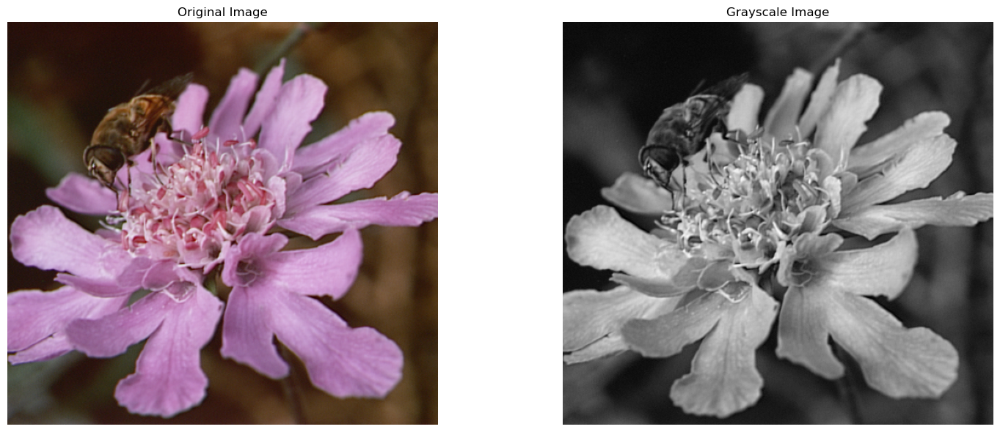

In [53]:
grayscale_image_2 = apply(image_2, rgb_to_grayscale)
display_image_comparison(image_2, grayscale_image_2, 'Original Image', 'Grayscale Image')

Let's compare between the different edge detectors. We'll also time them to compare their efficency. 

For now we won't set a threshold, since the ideal threshold for each mask may differ. This will however make some edge detectors not function properly.

In [54]:
import time

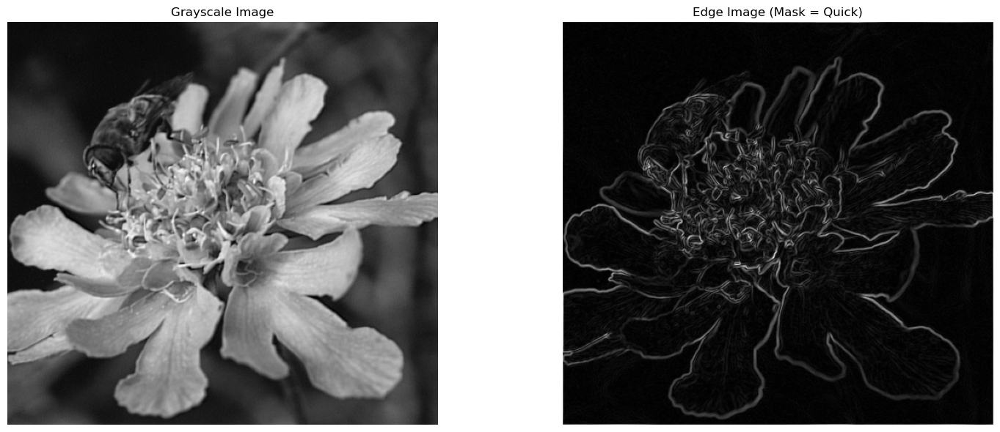

Operation 'Quick' took 0.0451 seconds.


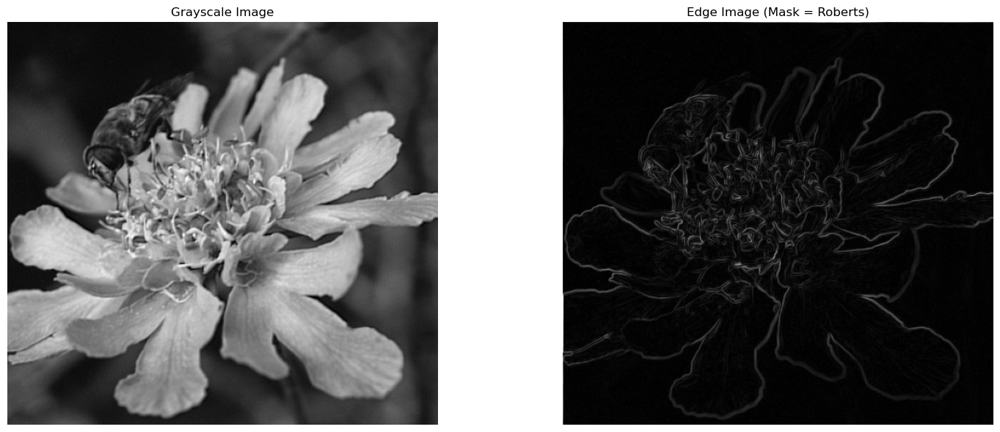

Operation 'Roberts' took 0.0144 seconds.


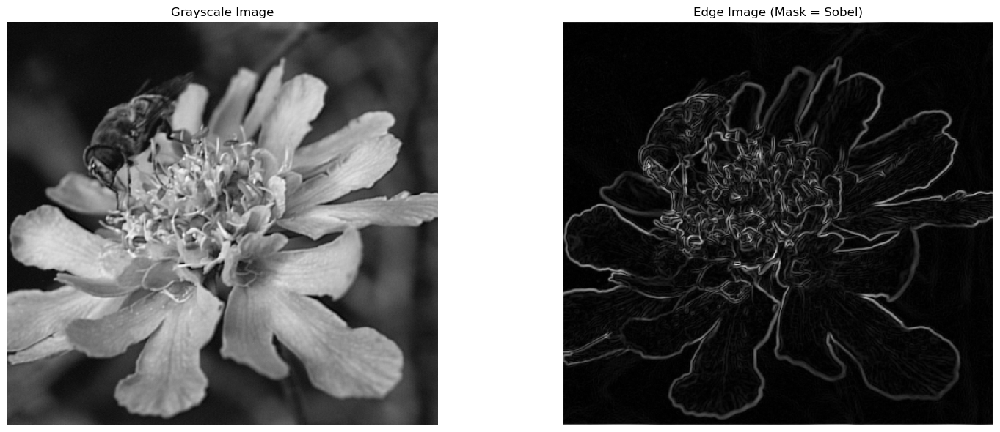

Operation 'Sobel' took 0.0233 seconds.


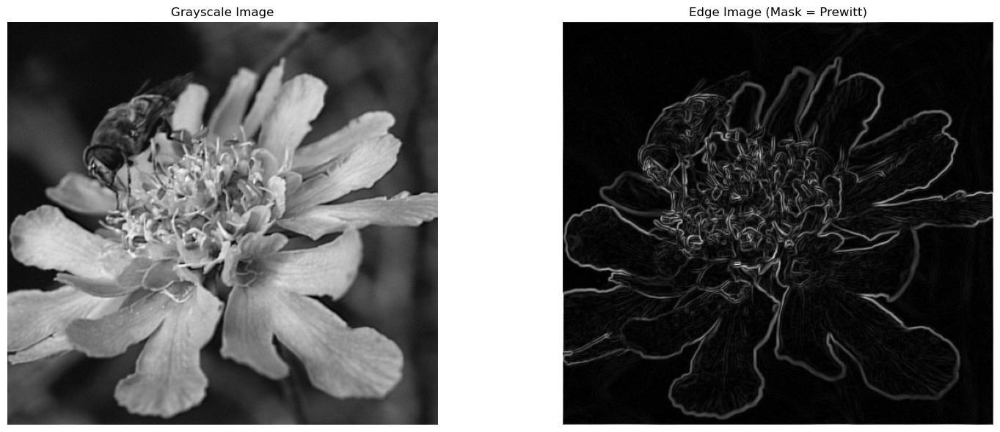

Operation 'Prewitt' took 0.0279 seconds.


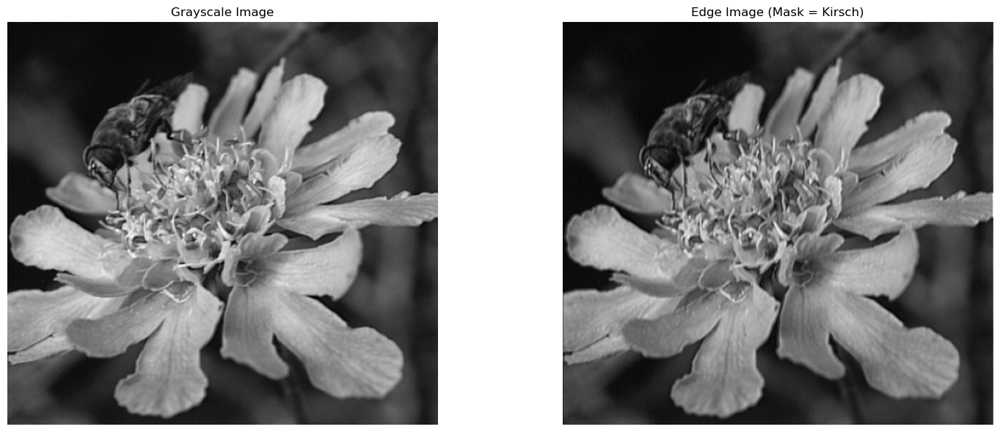

Operation 'Kirsch' took 0.1021 seconds.


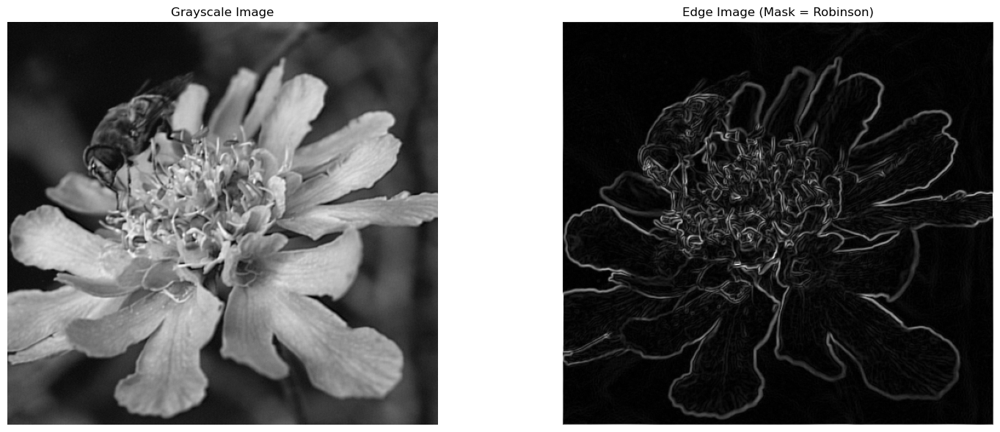

Operation 'Robinson' took 0.1016 seconds.


In [55]:
operations = [
    {'name': 'Quick', 'func': gradient_edge_detect, 'params': {'K': K_quick}},
    {'name': 'Roberts', 'func': gradient_edge_detect, 'params': {'K': K_roberts}},
    {'name': 'Sobel', 'func': gradient_edge_detect, 'params': {'K': K_sobel}},
    {'name': 'Prewitt', 'func': gradient_edge_detect, 'params': {'K': K_prewitt}},
    {'name': 'Kirsch', 'func': compass_edge_detect, 'params': {'K': K_kirsch}},
    {'name': 'Robinson', 'func': compass_edge_detect, 'params': {'K': K_robinson}}
]

for op in operations:
    start_time = time.perf_counter()
    edge_image = apply(grayscale_image_2, op['func'], **op['params'])
    elapsed_time = time.perf_counter() - start_time
    display_image_comparison(grayscale_image_2, edge_image, 'Grayscale Image', f"Edge Image (Mask = {op['name']})")
    print(f"Operation '{op['name']}' took {elapsed_time:.4f} seconds.")

The Roberts mask was the fastest to compute, this is likely due to it's size. The quick mask should have also been as fast if not faster, but the modification we make to it to compy with SciPy's `convolve2d` function make it much slower than it should be.

The edge images are all quite similar (except for the Kirsch one), but it seems Roberts, Sobel, and Kirsch produced the most clear edges. 

Lets see how changing the threshold for the operation affects the edge image. We'll use the Roberts mask for this demonstration.

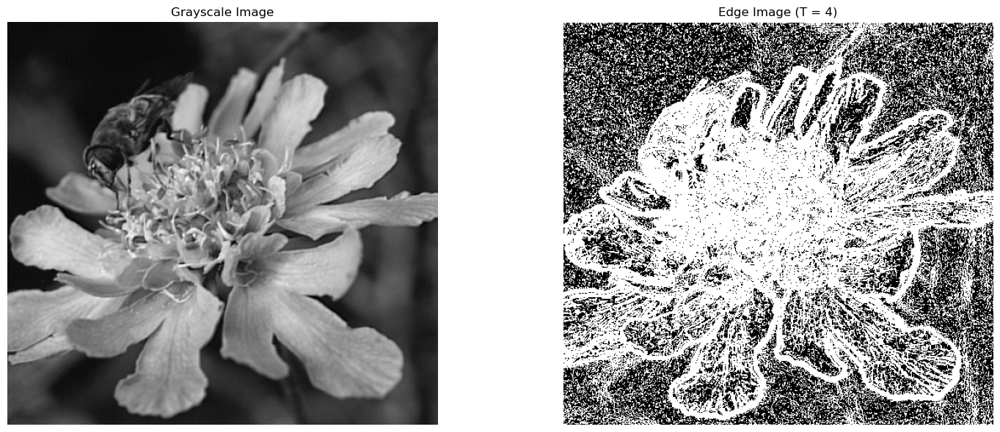

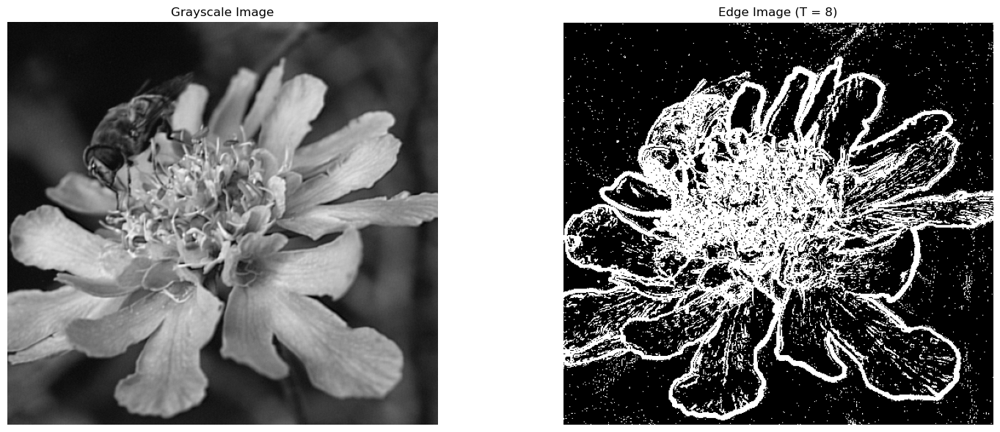

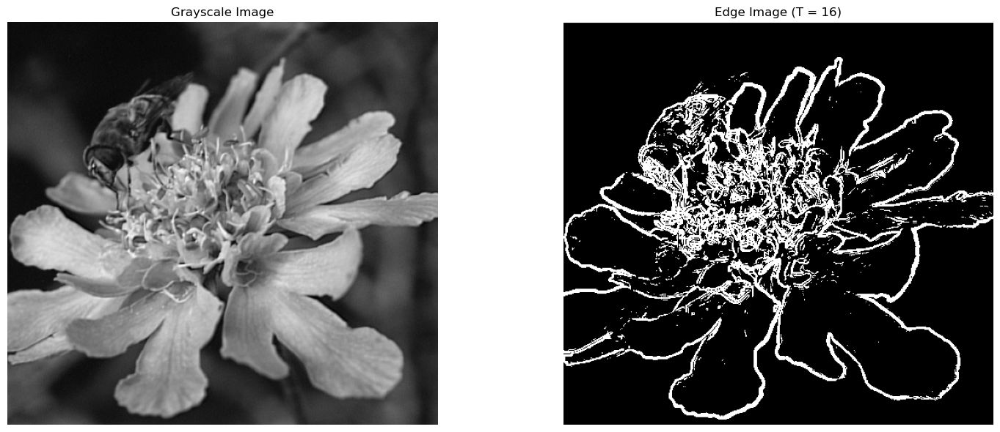

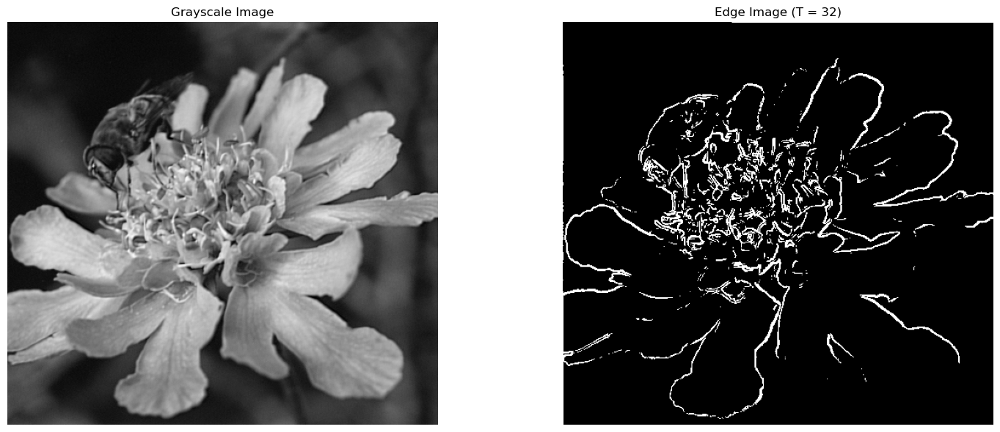

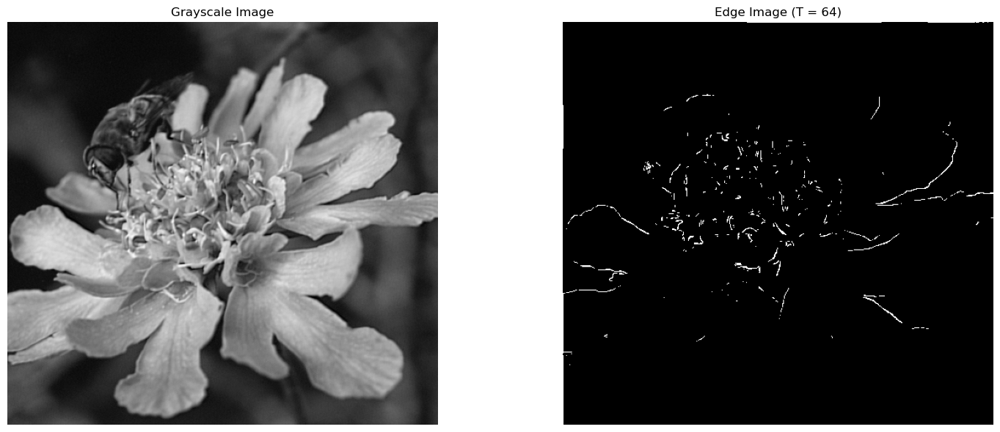

In [57]:
operations = [
    {'func': gradient_edge_detect, 'params': {'K': K_roberts, 'T': 4}},
    {'func': gradient_edge_detect, 'params': {'K': K_roberts, 'T': 8}},
    {'func': gradient_edge_detect, 'params': {'K': K_roberts, 'T': 16}},
    {'func': gradient_edge_detect, 'params': {'K': K_roberts, 'T': 32}},
    {'func': gradient_edge_detect, 'params': {'K': K_roberts, 'T': 64}}
]

for op in operations:
    edge_image = apply(grayscale_image_2, op['func'], **op['params'])
    display_image_comparison(grayscale_image_2, edge_image, 'Grayscale Image', f"Edge Image (T = {op['params']['T']})")

It seems $T = 16$ performes best for Roberts on this image.

When $T$ is too low we get too much noise in the edge image, when it's too high we lose a lot of the edge information. The exact value of $T$ to use for an image will vary based on both the image as well as the mask being used.

#### Example 2

For this example let's walk through the typical sequence of operations when performing edge detection.

In [68]:
image_3_path = "../TEST-IMAGES/OLD-CLASSIC/trucks.bmp"
image_3 = load_image(image_3_path)

Image Metadata for 'trucks.bmp':
 - Format: BMP
 - Size on Disk: 257.05 KB
 - Dimensions: 512x512 pixels
 - Mode: L
 - Channels: 1


Usually we start by perfoming histogram equalization.

In [69]:
image_3_histogram = apply(image_3, generate_histogram, return_array=True)
equalized_image_3_histogram = equalize_histogram(image_3_histogram)
equalized_image_3 = apply(image_3, match_histogram, return_array=False, h=image_3_histogram, h_prime=equalized_image_3_histogram)

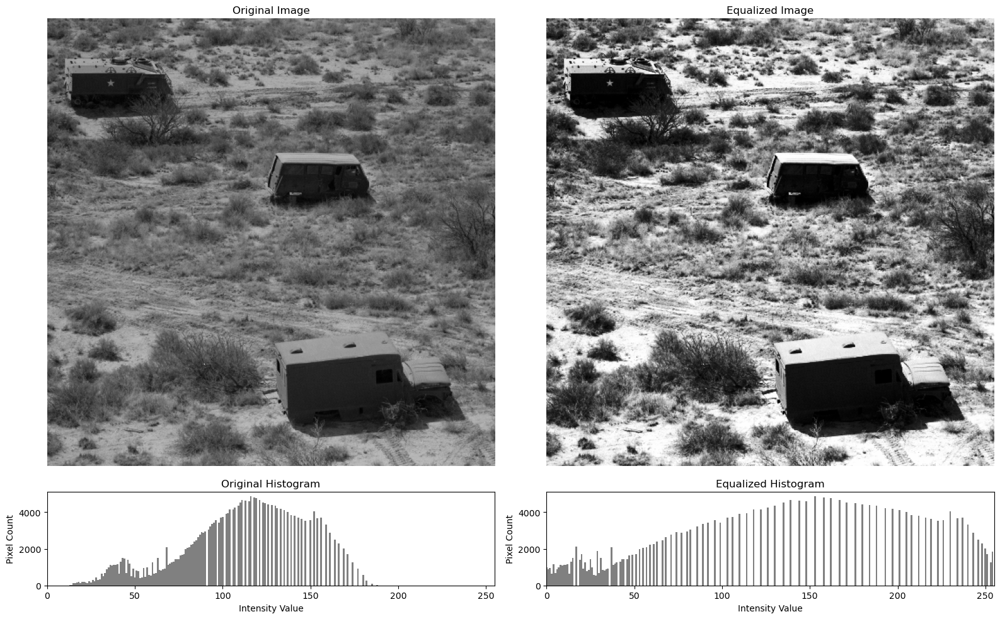

In [70]:
display_image_comparison_with_histogram(image_1=image_3, histogram_1=image_3_histogram, image_2=equalized_image_3, histogram_2=equalized_image_3_histogram, title_1='Original Image',
                                            hist_title_1='Original Histogram', title_2='Equalized Image', hist_title_2='Equalized Histogram')

Then we pick an operator: let's say Sobel for this example. We'd then try out different thresholds with this operator till we get a satisfactory image.

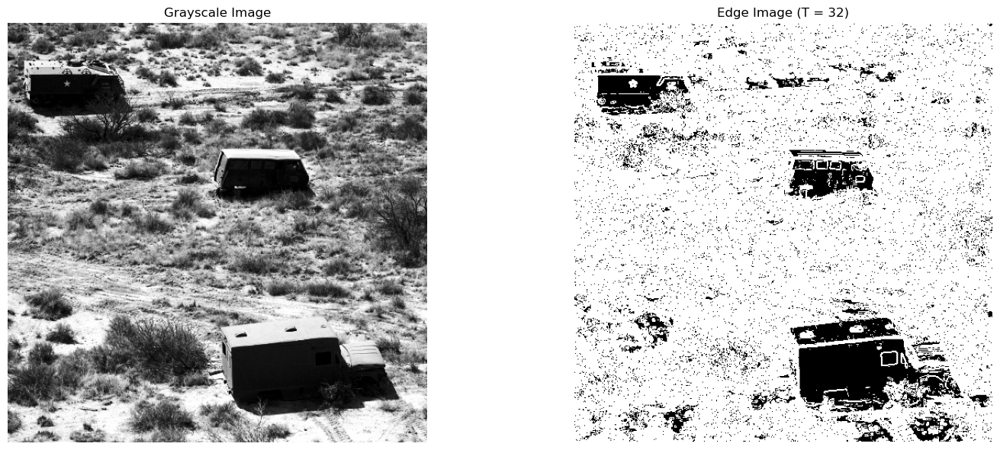

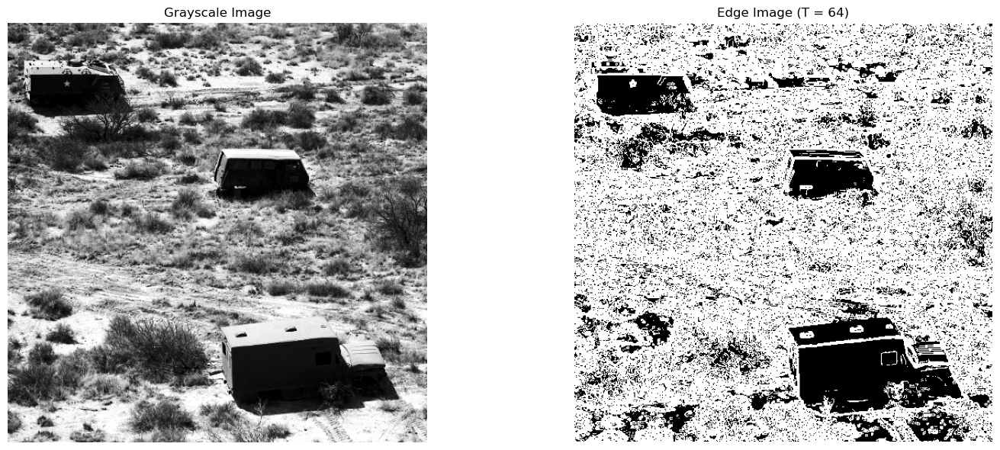

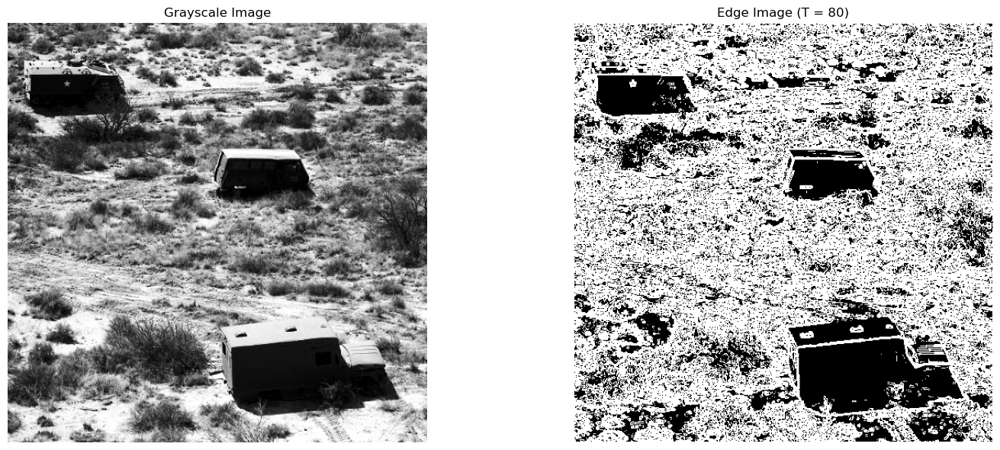

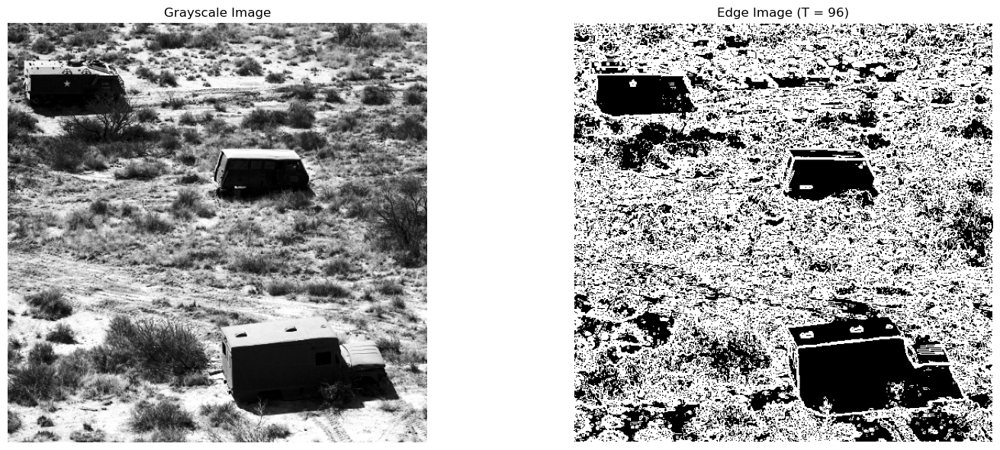

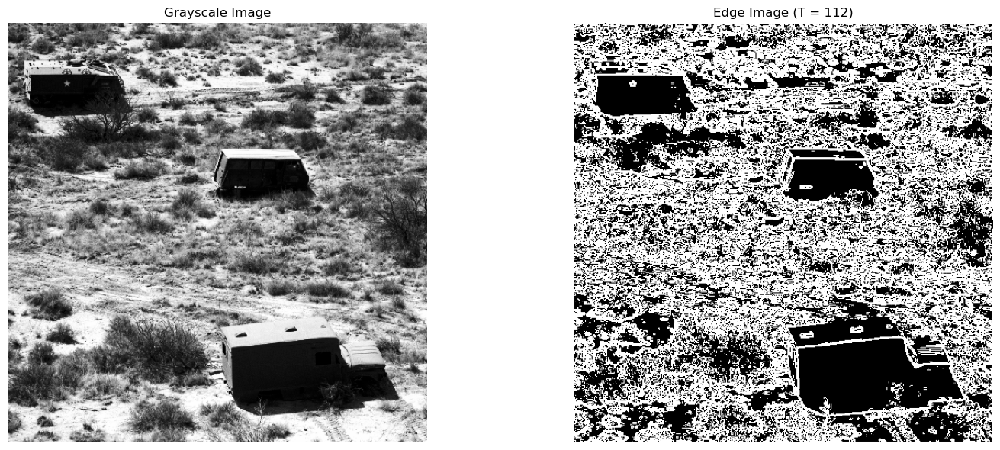

In [74]:
operations = [
    {'func': gradient_edge_detect, 'params': {'K': K_sobel, 'T': 32}},
    {'func': gradient_edge_detect, 'params': {'K': K_sobel, 'T': 64}},
    {'func': gradient_edge_detect, 'params': {'K': K_sobel, 'T': 80}},
    {'func': gradient_edge_detect, 'params': {'K': K_sobel, 'T': 96}},
    {'func': gradient_edge_detect, 'params': {'K': K_sobel, 'T': 112}}
]

for op in operations:
    edge_image = apply(equalized_image_3, op['func'], **op['params'])
    display_image_comparison(equalized_image_3, edge_image, 'Grayscale Image', f"Edge Image (T = {op['params']['T']})")

It seems for this example the higher thresholds (80, 96, 112) produced better results than the lower values. 